<a href="https://colab.research.google.com/github/ronen-halevy/ai-notebooks/blob/main/object-detection/image_localization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Transfer Learning For Image Classification

This post begins with an Introduction, which is a brief Transfer Learning  tutoria.
It is followed by an illustrative code of transfer learning, using a Tensorflow Hub Model.

served.



In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds

import requests
import PIL
from PIL import Image, ImageDraw

from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import datetime
import os
import random
import pathlib

%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


##Download Base Model

####**Select a Base Model Network From A List**


####**Table of  Base Models**

- These are the base models which can be selected for execution in the transfer learning illustration which follows.



- The cell below consists of 2 tables:

    - **base_model_url_table** - Which holds the download url for each base 
    model.
    - **model_image_size_map** - which holds the required dimenssion of input images. **NOTE:**: The image input dimenssions in TF Hub model are Unmodifiable**

- All models are listed in TF HUB pages.


In [ ]:
base_model_url_table = {
  "efficientnetv2-s": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_s/feature_vector/2",
  "efficientnetv2-m": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_m/feature_vector/2",
  "efficientnetv2-l": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_l/feature_vector/2",
  "efficientnetv2-s-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_s/feature_vector/2",
  "efficientnetv2-m-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_m/feature_vector/2",
  "efficientnetv2-l-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_l/feature_vector/2",
  "efficientnetv2-xl-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_xl/feature_vector/2",
  "efficientnetv2-b0-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b0/feature_vector/2",
  "efficientnetv2-b1-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b1/feature_vector/2",
  "efficientnetv2-b2-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b2/feature_vector/2",
  "efficientnetv2-b3-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b3/feature_vector/2",
  "efficientnetv2-s-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_s/feature_vector/2",
  "efficientnetv2-m-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_m/feature_vector/2",
  "efficientnetv2-l-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_l/feature_vector/2",
  "efficientnetv2-xl-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_xl/feature_vector/2",
  "efficientnetv2-b0-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b0/feature_vector/2",
  "efficientnetv2-b1-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b1/feature_vector/2",
  "efficientnetv2-b2-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b2/feature_vector/2",
  "efficientnetv2-b3-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b3/feature_vector/2",
  "efficientnetv2-b0": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b0/feature_vector/2",
  "efficientnetv2-b1": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b1/feature_vector/2",
  "efficientnetv2-b2": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b2/feature_vector/2",
  "efficientnetv2-b3": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b3/feature_vector/2",
  "efficientnet_b0": "https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1",
  "efficientnet_b1": "https://tfhub.dev/tensorflow/efficientnet/b1/feature-vector/1",
  "efficientnet_b2": "https://tfhub.dev/tensorflow/efficientnet/b2/feature-vector/1",
  "efficientnet_b3": "https://tfhub.dev/tensorflow/efficientnet/b3/feature-vector/1",
  "efficientnet_b4": "https://tfhub.dev/tensorflow/efficientnet/b4/feature-vector/1",
  "efficientnet_b5": "https://tfhub.dev/tensorflow/efficientnet/b5/feature-vector/1",
  "efficientnet_b6": "https://tfhub.dev/tensorflow/efficientnet/b6/feature-vector/1",
  "efficientnet_b7": "https://tfhub.dev/tensorflow/efficientnet/b7/feature-vector/1",
  "bit_s-r50x1": "https://tfhub.dev/google/bit/s-r50x1/1",
  "inception_v3": "https://tfhub.dev/google/imagenet/inception_v3/feature-vector/4",
  "inception_resnet_v2": "https://tfhub.dev/google/imagenet/inception_resnet_v2/feature-vector/4",
  "resnet_v1_50": "https://tfhub.dev/google/imagenet/resnet_v1_50/feature-vector/4",
  "resnet_v1_101": "https://tfhub.dev/google/imagenet/resnet_v1_101/feature-vector/4",
  "resnet_vmodel_image_size_map1_152": "https://tfhub.dev/google/imagenet/resnet_v1_152/feature-vector/4",
  "resnet_v2_50": "https://tfhub.dev/google/imagenet/resnet_v2_50/feature-vector/4",
  "resnet_v2_101": "https://tfhub.dev/google/imagenet/resnet_v2_101/feature-vector/4",
  "resnet_v2_152": "https://tfhub.dev/google/imagenet/resnet_v2_152/feature-vector/4",
  "nasnet_large": "https://tfhub.dev/google/imagenet/nasnet_large/feature_vector/4",
  "nasnet_mobile": "https://tfhub.dev/google/imagenet/nasnet_mobile/feature_vector/4",
  "pnasnet_large": "https://tfhub.dev/google/imagenet/pnasnet_large/feature_vector/4",
  "mobilenet_v2_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4",
  "mobilenet_v2_130_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4",
  "mobilenet_v2_140_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/feature_vector/4",
  "mobilenet_v3_small_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/feature_vector/5",
  "mobilenet_v3_small_075_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_small_075_224/feature_vector/5",
  "mobilenet_v3_large_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/feature_vector/5",
  "mobilenet_v3_large_075_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/feature_vector/5",
}

model_image_size_map = {
  "efficientnetv2-s": 384,
  "efficientnetv2-m": 480,
  "efficientnetv2-l": 480,
  "efficientnetv2-b0": 224,
  "efficientnetv2-b1": 240,
  "efficientnetv2-b2": 260,
  "efficientnetv2-b3": 300,
  "efficientnetv2-s-21k": 384,
  "efficientnetv2-m-21k": 480,
  "efficientnetv2-l-21k": 480,
  "efficientnetv2-xl-21k": 512,
  "efficientnetv2-b0-21k": 224,
  "efficientnetv2-b1-21k": 240,
  "efficientnetv2-b2-21k": 260,
  "efficientnetv2-b3-21k": 300,
  "efficientnetv2-s-21k-ft1k": 384,
  "efficientnetv2-m-21k-ft1k": 480,
  "efficientnetv2-l-21k-ft1k": 480,
  "efficientnetv2-xl-21k-ft1k": 512,
  "efficientnetv2-b0-21k-ft1k": 224,
  "efficientnetv2-b1-21k-ft1k": 240,
  "efficientnetv2-b2-21k-ft1k": 260,
  "efficientnetv2-b3-21k-ft1k": 300, 
  "efficientnet_b0": 224,
  "efficientnet_b1": 240,
  "efficientnet_b2": 260,
  "efficientnet_b3": 300,
  "efficientnet_b4": 380,
  "efficientnet_b5": 456,
  "efficientnet_b6": 528,
  "efficientnet_b7": 600,
  "inception_v3": 299,
  "inception_resnet_v2": 299,
  "nasnet_large": 331,
  "pnasnet_large": 331,
}


In [ ]:
#@title Select Base Model Name { run: "auto" }
base_model_name = "mobilenet_v2_140_224" # @param ['efficientnetv2-s', 'efficientnetv2-m', 'efficientnetv2-l', 'efficientnetv2-s-21k', 'efficientnetv2-m-21k', 'efficientnetv2-l-21k', 'efficientnetv2-xl-21k', 'efficientnetv2-b0-21k', 'efficientnetv2-b1-21k', 'efficientnetv2-b2-21k', 'efficientnetv2-b3-21k', 'efficientnetv2-s-21k-ft1k', 'efficientnetv2-m-21k-ft1k', 'efficientnetv2-l-21k-ft1k', 'efficientnetv2-xl-21k-ft1k', 'efficientnetv2-b0-21k-ft1k', 'efficientnetv2-b1-21k-ft1k', 'efficientnetv2-b2-21k-ft1k', 'efficientnetv2-b3-21k-ft1k', 'efficientnetv2-b0', 'efficientnetv2-b1', 'efficientnetv2-b2', 'efficientnetv2-b3', 'efficientnet_b0', 'efficientnet_b1', 'efficientnet_b2', 'efficientnet_b3', 'efficientnet_b4', 'efficientnet_b5', 'efficientnet_b6', 'efficientnet_b7', 'bit_s-r50x1', 'inception_v3', 'inception_resnet_v2', 'resnet_v1_50', 'resnet_v1_101', 'resnet_v1_152', 'resnet_v2_50', 'resnet_v2_101', 'resnet_v2_152', 'nasnet_large', 'nasnet_mobile', 'pnasnet_large', 'mobilenet_v2_100_224', 'mobilenet_v2_130_224', 'mobilenet_v2_140_224', 'mobilenet_v3_small_100_224', 'mobilenet_v3_small_075_224', 'mobilenet_v3_large_100_224', 'mobilenet_v3_large_075_224']


####**Load The Selected Base Model**

In [ ]:
base_model_url = base_model_url_table[base_model_name]
base_model = hub.KerasLayer(base_model_url, trainable=False)

##Parameters Setup

In [ ]:
#@title Set Batch Size { run: "auto" }
batch_size = 32 #@param {type:"integer"}

# Hard coded parameter:
num_of_image_channels = 3

# Set image dimenssions according to selected model
image_width = image_height = model_image_size_map.get(base_model_name, 224)

print("image_width: {image_width}".format(image_width=image_width))
print("image_height: {image_height}".format(image_height=image_height))


image_width: 224
image_height: 224


##Utility Functions




####Draw a bounding box

In [ ]:
def draw_bounding_box(image, ymin, xmin, ymax, xmax, color, thickness=3):
  draw = ImageDraw.Draw(image)
  draw.line([(xmin, ymin), (xmin, ymax), (xmax, ymax), (xmax, ymin),
             (xmin, ymin)],
            width=thickness,
            fill=color)
  return image

####Calculate IOU

In [ ]:
def intersection_over_union(pred_box, true_box):
    ymin_pred, xmin_pred, ymax_pred, xmax_pred = pred_box
    ymin_true, xmin_true, ymax_true, xmax_true = true_box

    xmin_overlap = np.maximum(xmin_pred, xmin_true)
    xmax_overlap = np.minimum(xmax_pred, xmax_true)
    ymin_overlap = np.maximum(ymin_pred, ymin_true)
    ymax_overlap = np.minimum(ymax_pred, ymax_true)

    pred_box_area = (xmax_pred - xmin_pred + 1) * (ymax_pred - ymin_pred + 1)
    true_box_area = (xmax_true - xmin_true + 1) * (ymax_true - ymin_true + 1)

    overlap_area = np.maximum((xmax_overlap - xmin_overlap) + 1,0)  * np.maximum((ymax_overlap - ymin_overlap) + 1, 0)
    union_area = (pred_box_area + true_box_area) - overlap_area

    iou = overlap_area / union_area
    return iou

##Download Dataset


- The dataset consists of 2 splits: Train and Test
- The Test split is farther sliced here into validation and test splits
- dataset is downloaded with attribute `as_supervised`=False (this is the default).
   - reason: the bounding boxes data, which we will use, is avbailable only in this mode.
   - implications: the dataset in this mode is arrange is a dict object. 
   - required action: as part of input pipeline preparations, we will reformat_dataset from the dict formatted to a tuple format.



In [ ]:
train_ds, info = tfds.load(
    name='StanfordDogs',
    split='train', 
    with_info=True,
)

(val_ds, test_ds) = tfds.load(
    name='StanfordDogs',
    split=['test[:80%]', 
    'test[80%:]'],
)

####Show dataset info

In [ ]:
info

tfds.core.DatasetInfo(
    name='stanford_dogs',
    version=0.2.0,
    description='The Stanford Dogs dataset contains images of 120 breeds of dogs from around
the world. This dataset has been built using images and annotation from
ImageNet for the task of fine-grained image categorization. There are
20,580 images, out of which 12,000 are used for training and 8580 for
testing. Class labels and bounding box annotations are provided
for all the 12,000 images.',
    homepage='http://vision.stanford.edu/aditya86/ImageNetDogs/main.html',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=120),
        'objects': Sequence({
            'bbox': BBoxFeature(shape=(4,), dtype=tf.float32),
        }),
    }),
    total_num_examples=20580,
    splits={
        'test': 8580,
        'train': 12000,
    },
    supervised_keys=('image'

####Extract Number of Classes and Class names From Dataset's Attributes

In [ ]:
num_classes = info.features['label'].num_classes
print('num_classes: ', num_classes)
class_names = info.features['label'].names
print('class_names: ',class_names)

num_classes:  120
class_names:  ['n02085620-chihuahua', 'n02085782-japanese_spaniel', 'n02085936-maltese_dog', 'n02086079-pekinese', 'n02086240-shih-tzu', 'n02086646-blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-rhodesian_ridgeback', 'n02088094-afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-walker_hound', 'n02089973-english_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-irish_wolfhound', 'n02091032-italian_greyhound', 'n02091134-whippet', 'n02091244-ibizan_hound', 'n02091467-norwegian_elkhound', 'n02091635-otterhound', 'n02091831-saluki', 'n02092002-scottish_deerhound', 'n02092339-weimaraner', 'n02093256-staffordshire_bullterrier', 'n02093428-american_staffordshire_terrier', 'n02093647-bedlington_terrier', 'n02093754-border_terrier', 'n02093859-kerry_blue_terrier', 'n02093991-irish_terrier', 'n02094114-norfolk_terrier', 'n02094258-norwich_

## 3. Create Input Pipeline 
---

####Remove Dataset Entries with Multi Objects
- Some of the images consist of more than a single dog
- To simplify the model, we will use only images with a single dog with a single bounding box

In [ ]:
def remove_multi_objects_images(ds):
    ds = ds.filter(lambda data: tf.shape(data['objects']['bbox'])[0] == 1)
    return  ds

train_ds = remove_multi_objects_images(train_ds)  
test_ds = remove_multi_objects_images(test_ds)  
val_ds = remove_multi_objects_images(val_ds)  


#### Reformat Datasets From Dict to Tupple
- Dataset was downloaded with as_supervised=False - see notes above

In [ ]:
def dict_to_tupple(data):
    image = data["image"]
    bbox = tf.squeeze(data['objects']['bbox'])
    class_label = data["label"]

    return image, (tf.one_hot(class_label, num_classes), bbox)

def reformat_dataset(dataset):      
    reformatted_dataset = dataset.map(dict_to_tupple, 
                                                 num_parallel_calls=16)
    return reformatted_dataset

train_ds = reformat_dataset(train_ds)
val_ds = reformat_dataset(val_ds)
test_ds = reformat_dataset(test_ds)


####Visualize Dataset Images - Before Resizing and Batching

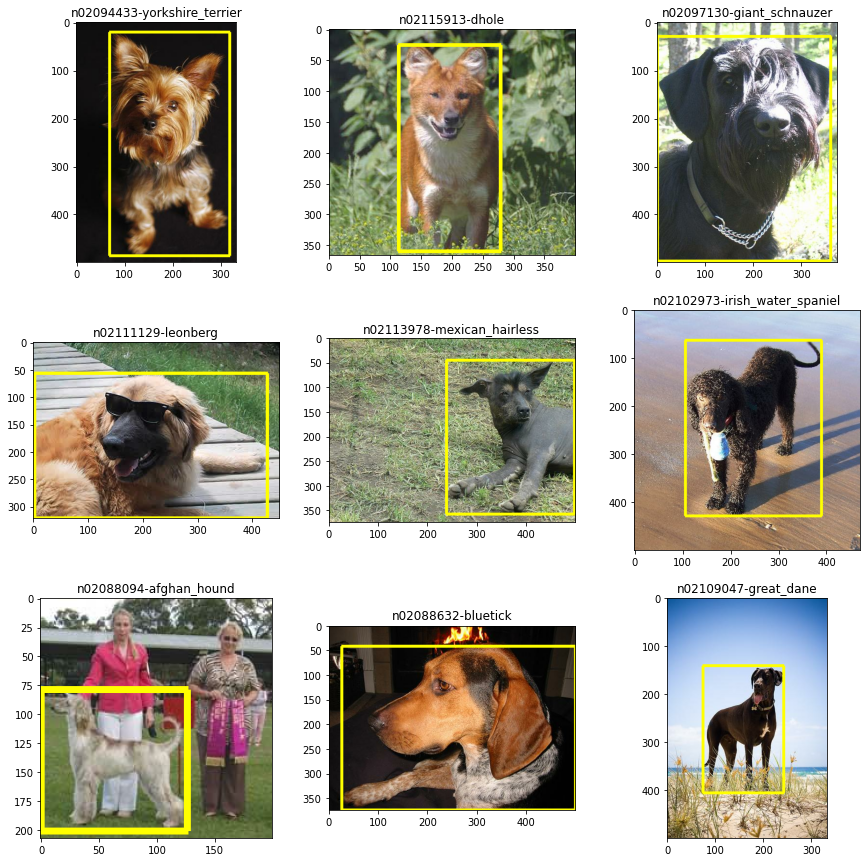

In [ ]:
get_label_name = info.features['label'].int2str
plt.figure(figsize=(15, 15))

for idx, (image, label) in enumerate(train_ds.take(9)):
  label, bbox = label
  ax = plt.subplot(3, 3, idx+1)
  image_pil = Image.fromarray(np.uint8(image.numpy()))
  im_width, im_height = image_pil.size
  ymin, xmin, ymax, xmax = ((bbox.numpy()) * [im_height, im_width, im_height, im_width])
  draw_bounding_box(image_pil, ymin, xmin, ymax, xmax, color=(255,255,0), thickness=6)
  ax.imshow(image_pil)
  ax.set_title(class_names[np.argmax(label)])


####**Some Values Setup**


- **batch size**: A batch size of 32 is a good starting point. There's a trade-off here, were a too small batch size might lead to a too slow processing due to lacking vectorization. A too large batch might leads to low accuracy and thus longer training time.


In [ ]:
#@title Set Batch Size { run: "auto" }

batch_size = 32#@param {type:"integer"}



- **image_height**, **image_width**: The are tradeoffs in setting the input dimenssions: keeping details vs process load. Anyway, since source data image is mostly none size uniform, resizing is essential. Since the NN deployed here has 5 pooling modules, which reduce size overall by 32, the size was set to a multiply of 32.

In [ ]:
#@title Set Input Image Resized Dimenssions { run: "auto" }

image_height = 224#@param {type:"integer"}
image_width =  224#@param {type:"integer"}

In [ ]:
def resize_image(image, label):
    image = tf.image.resize(image, [image_height, image_width])
    return  image, label

train_ds = train_ds.map(resize_image)
test_ds = test_ds.map(resize_image)
val_ds = val_ds.map(resize_image)


## 4. Configure Dataset for Performance
---

**Configure the Dataset for Performance**

Some essential data transformations were already performed by `image_dataset_from_directory`. 

That includes **`batching`**, **`image format decoding`**, **`splitting`** and `resizing`.

Those transformation were essential for the execution of the network.


Next transormations are needed to improve performance:


- **cache** -  keeps the images in memory after they're loaded off disk during 
the first epoch.

- **shuffle** - fills a buffer with buffer_size elements, then randomly samples elements from this buffer. The sampled elements are replaced by new dataset elements as depicted in the diagram below. 

- **prefetch** -  overlaps data preprocessing and model execution while training. (The tf.data.AUTOTUNE parameter defines a dynamic tuning of the number of prefetched data elements. The number depends on the number of batches consumed in a single step, i.e. on parallelism extent). In case both **perfecth** and **shuffle** are set, the shuffle buffer should be greater than or equal to the full size of the dataset.

- **normalization** - standardizes the inputs to the range [0,1], which improves performance.


- **augmentation** - expands training dataset, increases the diversity of training set, by applying transformations, such as image rotation, flips, shifts, and shear.




In [ ]:
def configure_for_performance(ds):
  ds = ds.cache()
  ds = ds.shuffle(buffer_size=1000)
  ds = ds.batch(batch_size, drop_remainder=False)
  ds = ds.prefetch(buffer_size=tf.data.AUTOTUNE)
  return ds

train_ds = configure_for_performance(train_ds)
val_ds = configure_for_performance(val_ds)
test_ds = configure_for_performance(test_ds)

**Data Augmentation** - Expand training dataset size

In [ ]:
data_augmentation = tf.keras.Sequential(
  [
    tf.keras.layers.RandomFlip("horizontal",
                      input_shape=(image_height,
                                  image_width,
                                  3)),
    tf.keras.layers.RandomRotation(0.1, fill_mode="nearest",),
    tf.keras.layers.RandomZoom(0.1),
  ]
)

#####**Visualize images after various random augmentation transformations:**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


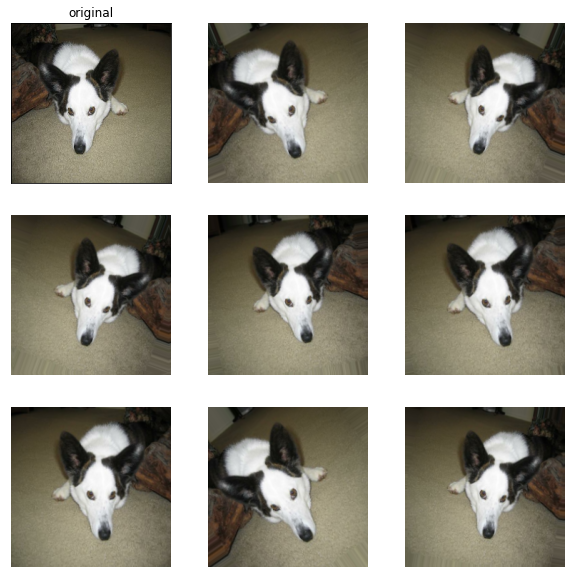

In [ ]:
plt.figure(figsize=(10, 10))
batch_data = next(iter(train_ds))

images, labels = batch_data

for idx, image in enumerate(images):
  if idx > 9:
    break

  ax = plt.subplot(3, 3, 1)
  ax.set_title('original')
  plt.imshow(image/255)
  ax.set_xticks([])
  ax.set_yticks([])
  for i in range(8):
    augmented_images = data_augmentation((tf.expand_dims(image, axis=0, name=None)))
    ax = plt.subplot(3, 3, i + 2)
    plt.imshow(augmented_images[0].numpy().astype("float32")/255)
    plt.axis("off")

Set Augmentation to training dataset

In [ ]:
train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y))

**Present some sample images of the final train dataset:**

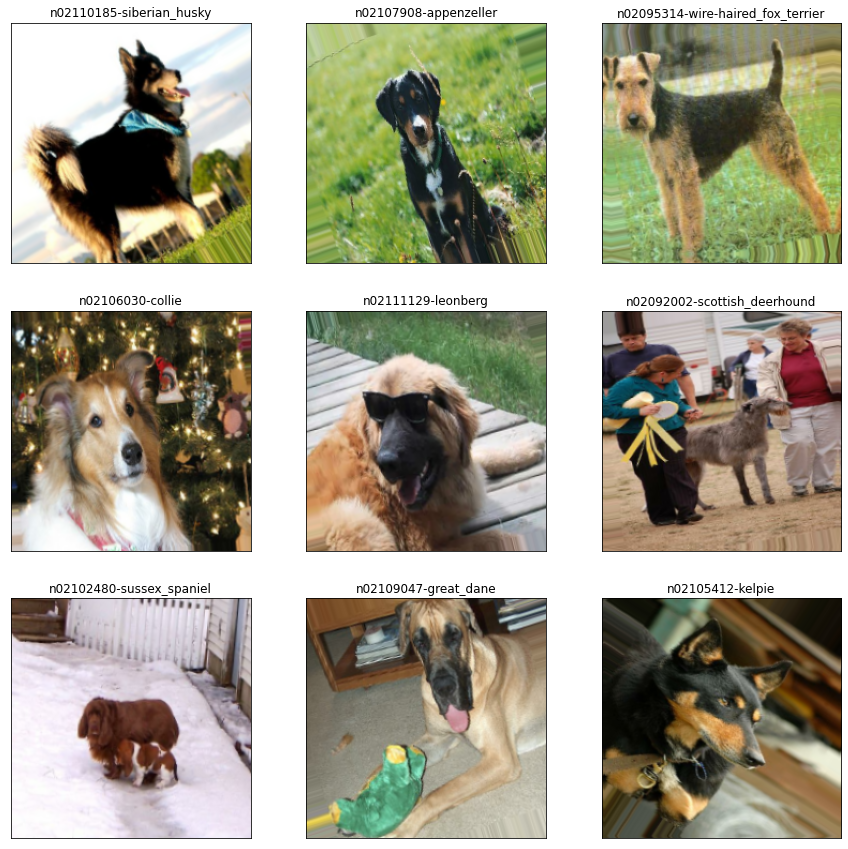

In [ ]:
get_label_name = info.features['label'].int2str

batch = train_ds.take(1)

fig = plt.figure()
fig.set_figheight(15)
fig.set_figwidth(15)

itr = batch.as_numpy_iterator()
images, labels = itr.next()
n_rows = 3
n_cols = 3
classes, bboxes = labels
for idx in range(n_rows*n_cols):
  ax = fig.add_subplot(n_rows, n_cols, idx+1)
  ax.imshow(images[idx]/255)
  ax.set_title(get_label_name(np.argmax(classes[idx])))
  ax.set_xticks([])
  ax.set_yticks([])

**Present a bunch of sample images of the final train dataset:**


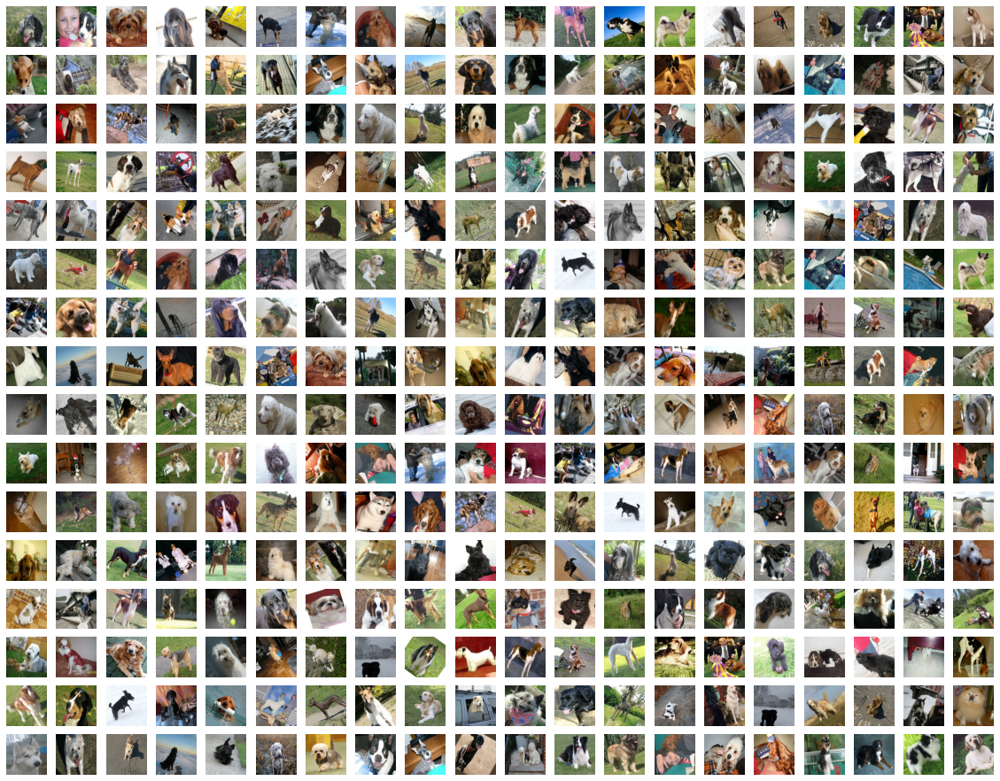

In [ ]:
plt.figure(figsize=(20, 20))
batches_in_loop = 10
for j in range(batches_in_loop):
  image_batch, _ = next(iter(train_ds))
  for i in range(32):
    ax = plt.subplot(20, 20, j*32 + i + 1)
    plt.imshow(image_batch[i]/255)
    plt.axis("off")

##**Create The Model**



- Add an output layer on top of the base mode
- Add an imput and Rescaling layers (Those layers have no params)

In [ ]:
num_of_image_channels = 3
inputs = tf.keras.Input(shape=(image_height, image_width, num_of_image_channels), name='input')
scale_layer = tf.keras.layers.Rescaling(scale=1 / 255)
x = scale_layer(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.Dropout(0.5, name='dropout')(x)

bbox_head = tf.keras.layers.Dense(4, 	name="bounding_box")(x)

class_head = tf.keras.layers.Dense(len(class_names), activation='softmax', 
                                   name='classification')(x)

model = tf.keras.Model(inputs, (class_head, bbox_head))

## **Build and Compile**

- At this cycle, the base model is freezed
- Learning rate is kept small

In [ ]:

model.build((None, image_height, image_width, num_of_image_channels))
model.summary()

base_model.trainable = False


model.compile(optimizer='adam', 
              loss = {'classification' : 'categorical_crossentropy',
                      'bounding_box' : 'mse'
                     },
              metrics = {'classification' : 'accuracy',
                         'bounding_box' : 'mse'
                        })


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input[0][0]']                  
                                                                                                  
 keras_layer (KerasLayer)       (None, 1792)         4363712     ['rescaling[0][0]']              
                                                                                                  
 dropout (Dropout)              (None, 1792)         0           ['keras_layer[0][0]']        

#### **Notes on Printed The Model Summary Table** (Printed in the cell above)

the table shows that out of 4,372,677 parrams, shows that  8,965 are `Trainable params`.

Here's the number of `Trainable params` calculation:

 - Size of basic model output: 1792
 - Size of new ouput layer: 5
 - ->Total weights to calculate: **1792*5+5** = **8965**

##**Fit**

####**Set a TensorBoard Callback**

The callback creates and stores logs, which later will be used for Tensorboard's Metric Display


In [ ]:
#@title Set Histogram  Calculation Step (in epochs) { run: "auto" }

histogram_freq =  1#@param {type:"integer"}

In [ ]:
def set_tb_cb():
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_cb = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=histogram_freq) 
    return tensorboard_cb

####**Set Params**

In [ ]:
#@title Set Number of Epochs for New Model Training (Base Model Trainable=False) { run: "auto" }
epochs =  5#@param {type:"integer"}

####**Do The Train**

In [ ]:
tensorboard_cb = set_tb_cb()
history = model.fit(
    train_ds,
    epochs=epochs, 
    validation_data=val_ds,
    callbacks=[tensorboard_cb]
    )


Epoch 1/5
352/352 [==============================] - 133s 366ms/step - loss: 2.4488 - classification_loss: 1.9756 - bounding_box_loss: 0.4733 - classification_accuracy: 0.5055 - bounding_box_mse: 0.4733 - val_loss: 0.7258 - val_classification_loss: 0.6837 - val_bounding_box_loss: 0.0421 - val_classification_accuracy: 0.7960 - val_bounding_box_mse: 0.0421
Epoch 2/5
352/352 [==============================] - 122s 347ms/step - loss: 1.0513 - classification_loss: 0.9847 - bounding_box_loss: 0.0666 - classification_accuracy: 0.7078 - bounding_box_mse: 0.0666 - val_loss: 0.6142 - val_classification_loss: 0.5953 - val_bounding_box_loss: 0.0189 - val_classification_accuracy: 0.8110 - val_bounding_box_mse: 0.0189
Epoch 3/5
352/352 [==============================] - 122s 346ms/step - loss: 0.8633 - classification_loss: 0.8364 - bounding_box_loss: 0.0268 - classification_accuracy: 0.7511 - bounding_box_mse: 0.0268 - val_loss: 0.5739 - val_classification_loss: 0.5564 - val_bounding_box_loss: 0.017

## Save Weights

In [ ]:
# model.save_weights('./image_localization_checkpoint.h5')

In [ ]:
# model.load_weights('./image_localization_checkpoint.h5')

##**Visualize Training Results**
---

Demonstrating 2 options for visualizing output metrics:

Note: Validation results are sometimes better than Train results.

Possible reasons:

- Validation is a smaller dataset, maybe it happens to hold an 'easier' data
- Validation is calculated after epoch ends, and coefficients and batch normalization coeffs are all set already.


#####Plot Metrics using `history`

In [ ]:
def visualize_training_results(hist, *metrics, epochs_range):
  plt.figure(figsize=(8, 8))
  for idx, metric in enumerate(metrics):
    plt.subplot(1, 2, idx+1)
    plt.plot(epochs_range, hist[metric], label='train'+metric)
    plt.plot(epochs_range, hist['val_'+metric], label='validation_'+metric)
    plt.legend(loc='lower right')
    plt.title(metric)


hist = history.history
visualize_training_results(hist, 'classification_accuracy',  'classification_loss', epochs_range = history.epoch)
visualize_training_results(hist, 'bounding_box_mse',  'bounding_box_loss', epochs_range =  history.epoch)


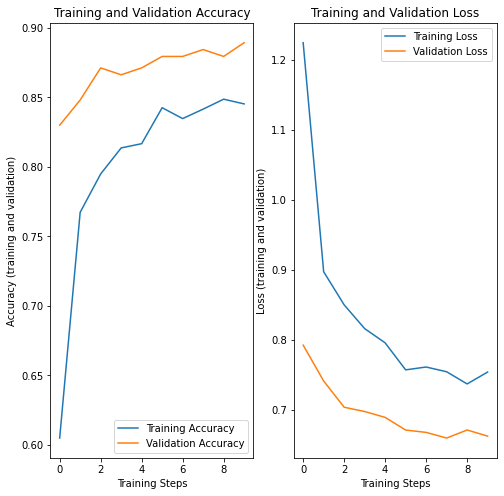

In [ ]:
show_metrics(history)

#####Plot Metrics using `TensorBoard`

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

##**A Second Training Cycle**

- On the first cycle, the base model was freezed.

- Now unfreeze the base model and take another fine-tuning train cycle of the entire model

  - Set base_model.trainable = True

- To avoid updates of `BatchNormalization` coefficients, we set training=False, so the model will update weights but will actually run on Inference mode.

####**Set model params**

In [ ]:
base_model.trainable = True

####**Compile**

Must Re-compile to set new training parametes:
- Optimizer
- Learning Rate
- Set base_model.trainable = True

In [ ]:

model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), 
              loss = {'classification' : 'categorical_crossentropy',
                      'bounding_box' : 'mse'
                     },
              metrics = {'classification' : 'accuracy',
                         'bounding_box' : 'mse'
                        })



####**Model Summary**

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input[0][0]']                  
                                                                                                  
 keras_layer (KerasLayer)       (None, 1792)         4363712     ['rescaling[0][0]']              
                                                                                                  
 dropout (Dropout)              (None, 1792)         0           ['keras_layer[0][0]']        

####**Set Fit Params**





In [ ]:
#@title Set Number of Epochs for End-To-End Fine Tune Training { run: "auto" }

epochs =  5#@param {type:"integer"}

####**Set the TensorFlow Callback**

In [ ]:
tensorboard_cb_fine_tune = set_tb_cb()

####**Fit - Fine Tune Cycle**

In [ ]:
fine_tune_results = model.fit(
          train_ds,
          epochs=epochs, 
          validation_data=val_ds,
          callbacks=[tensorboard_cb_fine_tune]
        )


Epoch 1/5
352/352 [==============================] - 206s 543ms/step - loss: 0.6606 - classification_loss: 0.5496 - bounding_box_loss: 0.0218 - classification_accuracy: 0.8268 - bounding_box_mse: 0.0218 - val_loss: 0.6766 - val_classification_loss: 0.5722 - val_bounding_box_loss: 0.0151 - val_classification_accuracy: 0.8250 - val_bounding_box_mse: 0.0151
Epoch 2/5
352/352 [==============================] - 186s 527ms/step - loss: 0.6032 - classification_loss: 0.4939 - bounding_box_loss: 0.0200 - classification_accuracy: 0.8415 - bounding_box_mse: 0.0200 - val_loss: 0.6907 - val_classification_loss: 0.5877 - val_bounding_box_loss: 0.0136 - val_classification_accuracy: 0.8196 - val_bounding_box_mse: 0.0136
Epoch 3/5
352/352 [==============================] - 186s 527ms/step - loss: 0.5601 - classification_loss: 0.4520 - bounding_box_loss: 0.0188 - classification_accuracy: 0.8538 - bounding_box_mse: 0.0188 - val_loss: 0.6725 - val_classification_loss: 0.5702 - val_bounding_box_loss: 0.013

## Save Weights

In [ ]:
# model.save_weights('./image_localization_checkpoint_fine_tune.h5')

In [ ]:
model.load_weights('./image_localization_checkpoint_fine_tune.h5')

##**Metrics Visualizations of Fine-Tune Training**

Plotted below are both python plots and TensorBoard metric plots

#### Metric Plots

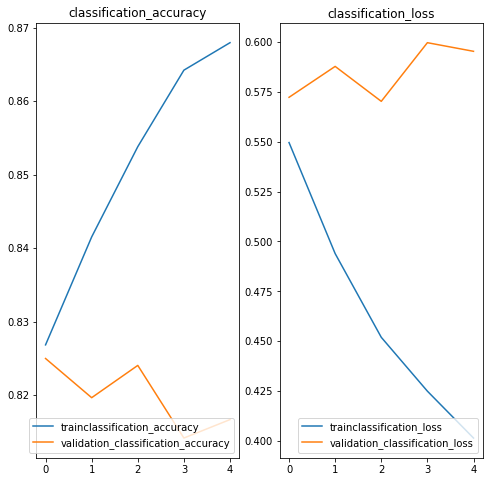

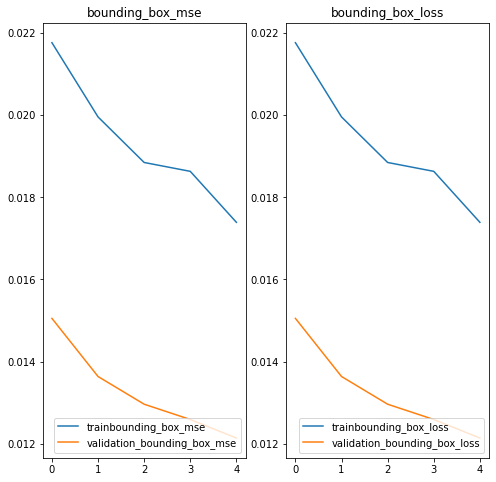

In [ ]:
hist = fine_tune_results.history
visualize_training_results(hist, 'classification_accuracy',  'classification_loss', epochs_range = fine_tune_results.epoch)
visualize_training_results(hist, 'bounding_box_mse',  'bounding_box_loss', epochs_range =  fine_tune_results.epoch)


##**Inference**

####Evalualte with Test Dataset

Evaluate outputs result metrics

In [ ]:
loss, classification_loss, bounding_box_loss, classification_accuracy, bounding_box_mse = model.evaluate(test_ds, steps=1)

1/1 [==============================] - 2s 2s/step - loss: 0.5941 - classification_loss: 0.5846 - bounding_box_loss: 0.0095 - classification_accuracy: 0.8125 - bounding_box_mse: 0.0095


####Predict with Test Dataset

In [ ]:
images_test_batch, labels_test_batch = next(iter(test_ds))
predictions = model.predict(images_test_batch)

####**Present Some Prediction Results**

- Blue box: correct class prediction
- Red box:  wrong class prediction 
- White box: test expected box
- IOU is indicated per a bounding box
- Text is colored Blue if classification is correct, Red otherwise.
- Correct class in noted in parenthesis

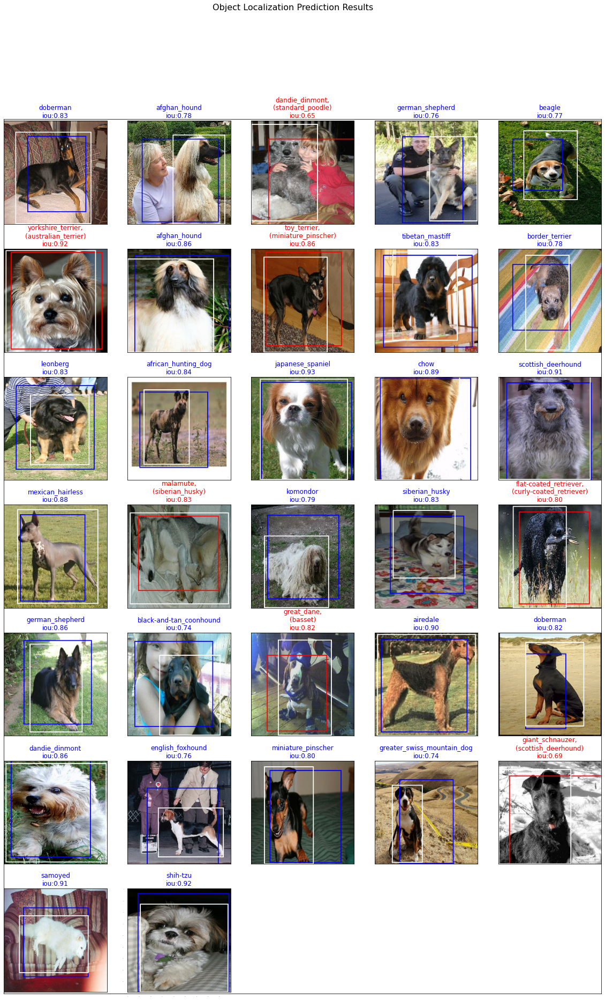

In [ ]:
nun_of_plot_images=images_test_batch[:nun_of_plot_images].shape[0]
test_images = images_test_batch[:nun_of_plot_images]
test_classes, test_bboxes = labels_test_batch
test_classes=test_classes[:nun_of_plot_images]
test_bboxes=test_bboxes[:nun_of_plot_images]
test_boxes = test_bboxes[:nun_of_plot_images]
pred_classes = predictions[0][:nun_of_plot_images]
pred_bboxes =  predictions[1][:nun_of_plot_images]

fig = plt.figure(figsize=(20, 30))
fig.suptitle('Object Localization Prediction Results', fontsize=16)

for idx, (image, pred_bbox, pred_class, test_box, test_class) in enumerate(zip(test_images, pred_bboxes, pred_classes, test_boxes, test_classes)):
  image_pil = Image.fromarray(np.uint8(image.numpy()))
  
  plt.yticks([])
  plt.xticks([])
  ax = fig.add_subplot(7, 5, idx+1)
  
  pred_class = np.argmax(pred_class)
  test_class = np.argmax(test_class)
  color = (0, 0, 255) if (pred_class == test_class) else (255, 0, 0)
  
  pred_class_name = class_names[pred_class]
  pred_class_name=pred_class_name[pred_class_name.find('-'):]
  pred_class_name = pred_class_name.split("-", 1)

  test_class_name = class_names[test_class]
  test_class_name = test_class_name.split("-", 1)
  title = pred_class_name[1] if (pred_class == test_class) else (f'{pred_class_name[1]},\n({test_class_name[1]})')

  im_height, im_width = image_pil.size

  ymin, xmin, ymax, xmax = pred_bbox *[im_height, im_width, im_height, im_width]
  image_pil = draw_bounding_box(image_pil, ymin, xmin, ymax, xmax, color=color, thickness=2)

  t_ymin, t_xmin, t_ymax, t_xmax = test_box *[im_height, im_width, im_height, im_width]
  image_pil = draw_bounding_box(image_pil, t_ymin, t_xmin, t_ymax, t_xmax, color=(255,255,255), thickness=2)
  
  iou = intersection_over_union(pred_bbox, test_box)
  title = f'{title}\niou:{iou:.2f}'
  color = ('b') if (pred_class == test_class) else 'r'
  ax.set_title(title, color=color)

  ax.imshow(image_pil)

In [ ]:
from google.colab import files
model.save('mtransfer_learning.h5')
files.download('mtransfer_learning.h5') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>